# Matter Waves


### Peter Onyisi
<img src="images/texas_logo.png" width="400" align="left"/>

In [2]:
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams['figure.figsize'] = (8,6)
matplotlib.rcParams['font.size'] = 16
matplotlib.rcParams['animation.embed_limit'] = 60
matplotlib.rcParams['xtick.top'] = True
matplotlib.rcParams['ytick.right'] = True
import math
import numpy
from matplotlib import animation

Classical physics developed the distinct concepts of a "wave" and of a "particle":
* a "particle" is some kind of object that has a precise position and velocity; it can be localized in a specific place, and has a definite velocity. In general one assumes that a "fundamental" particle has no structure (e.g. a rubber ball which can change shape is composed of many smaller particles).  One assumes these are governed by Newton's laws of motion.
* a "wave" is some kind of extended object, which has a value in many parts of space. It has an _amplitude_ which is different from its _intensity_ (which is generally amplitude squared). The amplitude has the characteristic that it can interfere (even with itself), so two wave components that would _individually_ give a large intensity can cancel each other, in a case of *destructive interference*.

We've been seeing how quantum mechanics can imply minimum energies or angular momenta for particles. This is very intricately related to perhaps the key feature of quantum mechanics, which is that there is no real distinction between "particles" and "waves"; the difference is basically a feature of the way us big, classical observers look at problems. Let's look at an important example of how a thing we traditionally think of as a "particle" can show up as a "wave": electron scattering off of a crystal.

## Bragg Scattering of Waves

When waves hit things they have a tendency to "scatter" from them. For example, an electromagnetic wave encountering an electron exerts force on the electron via the electric and magnetic fields of the wave; the electron in return, being accelerated, emits electromagnetic radiation.  The radiation pattern from the electron will be centered on the electron, regardless of the shape of the incident waves, which means that even if we have a plane wave traveling in a specific direction, the scattered radiation could be going somewhere completely different.

If a set of scatterers are arranged in a repeated pattern - for example, atoms in a crystal - then we have to consider interference between the radiation patterns from each scatterer.  This can actually tell us about the structure of the crystal. In general, in any direction other than the direction of the incoming beam, the waves from each atom will be out of step with each other (be "out of phase") and will destructively interfere.  However, for certain combinations of the direction of the inbound beam and direction of the outgoing wave, the spacing of the atoms can result in constructive interference.

[![Bragg's Law](images/Bragglaw.png)](http://hyperphysics.phy-astr.gsu.edu/hbase/quantum/bragg.html)

This pattern of very strong reflection only when the incident wave makes certain specific angles to the plane of the crystal is called _Bragg scattering_ and fundamentally requires the scattered object to be a wave: it involves the interference of the waves from each individual atom. If the scattered objects are particles, the scattering rate will just add from every atom, and there won't be special angles of the incident beam that cause scattering to happen.  This is a well-known feature of X-ray scattering on crystals and is used to understand the structure of the atoms in a crystal.

A similar phenomenon occurs for scattering in the "forward" direction (which is just called *diffraction*). For a 2D square lattice with distance $d$ between atoms, the 

$$ \begin{align*}
n_1\lambda &= d(\sin \theta_1 - \sin \theta_2) \\
n_2\lambda &= d(\cos \theta_1 - \cos \theta_2)
\end{align*}
$$

where $\theta_1$ is the angle the incident beam makes with the crystal plane, $\theta_2$ is the angle the diffracted beam makes with the crystal plane, and $n_1$ and $n_2$ are integers (which can be different from each other, zero, or negative). Since $n_1 = n_2 = 0$ and $\theta_1=\theta_2$ always solves this, there is always scattering directly in the direction of the incident beam.

3.628473386705816e-06


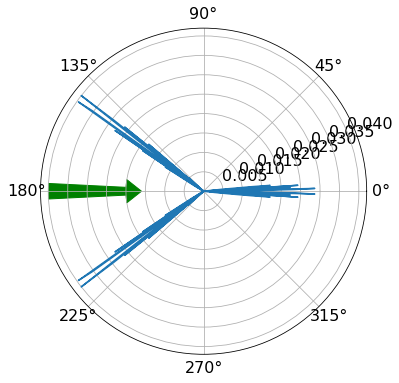

In [7]:
# simulate 2D isotropic wave scattering from a grid

def intensity_at_angle(detradius, dettheta, wavetheta, wavelength, scatterx, scattery):
    # assume incident wave is sinusoidal
    # incident wave is assumed to have phase zero at the origin
    phase0 = 2*math.pi*(scatterx*numpy.cos(wavetheta)/wavelength+scattery*numpy.sin(wavetheta)/wavelength)
    #print(phase0)
    # phase change to detection point
    detx = detradius*numpy.cos(dettheta)
    dety = detradius*numpy.sin(dettheta)
    phase1 = 2*math.pi*numpy.sqrt((detx-scatterx)**2+(dety-scattery)**2)/wavelength
    #print(phase0+phase1)
    return numpy.mean(numpy.sin(phase0+phase1))**2

# square grid
grid = numpy.meshgrid(numpy.linspace(-1, 1, 101), numpy.linspace(-1, 1, 101))
# plt.plot(grid[0], grid[1])
print(intensity_at_angle(10,0.2, math.pi/2 ,0.5,grid[0], grid[1]))
thetas = numpy.linspace(0, 2*math.pi, 1000)
INCIDENT_THETA=0.
WAVELENGTH=0.012
intensities = [intensity_at_angle(10, _, INCIDENT_THETA, WAVELENGTH, grid[0], grid[1]) for _ in thetas]
plt.polar(thetas, intensities)
plt.arrow(math.pi+INCIDENT_THETA, numpy.max(intensities), 0, -0.5*numpy.max(intensities), 
          width=0.1, color='green', head_length=0.1*numpy.max(intensities))
plt.show()

In [8]:
# animate changing the incident beam angle
from IPython.display import HTML
fig = plt.figure(figsize=(8,8))
line, = plt.polar([],[])
plt.ylim(0,0.03)
txt=plt.text(3/4*math.pi,0.045,'')
arr=plt.arrow(0, 1, 0, 0, 
          width=0.1, color='green', head_length=0.1*numpy.max(intensities))

incident_thetas = numpy.linspace(0,math.pi/2,200)
def animate(i):
    angle = incident_thetas[i]
    intensities = [intensity_at_angle(10, _, angle, WAVELENGTH, grid[0], grid[1]) for _ in thetas]
    line.set_data(thetas, intensities)
    arr2=matplotlib.patches.FancyArrow(math.pi+angle, 0.03, 0, -0.01, 
          width=0.1, color='green', head_length=0.1*numpy.max(intensities))
    arr.set_xy(arr2.xy)
    txt.set_text(f'{angle:.3f}')
    return [line,arr]

anim = animation.FuncAnimation(fig, animate,
                               frames=len(incident_thetas), 
                               repeat=False)
plt.close()
HTML(anim.to_jshtml(fps=4))

In 1927 Davisson and Germer did an experiment scattering an electron beam on a crystal of nickel and observed that, for given energies, electrons incident at certain angles scattered strongly, while those at other angles did not scatter. These angles depended on the energy of the electrons. This is exactly the behavior one would expect for a wave, with a wavelength that depends on the wavelength of the electrons.  Simultaneously, [Thomson and Reid](https://www.nature.com/articles/119890a0) observed forward diffraction of electrons passing through a thin film of celluloid, showing deflection by specific angles, again like waves.

[![Davisson-Germer Figure 2](images/Davisson-Germer-fig2.png)](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1085484/pdf/pnas01816-0027.pdf)

Conclusion: electrons must be able to interfere with themselves - in some way they must have wave-like characteristics. Since the distance $d$ for nickel is $2 \times 10^{-10}$ m, the conclusion was that the "wavelength" for the relevant electrons - 60 up to 350 electronvolts (eV) - was in this range (somewhat smaller than this value). Davisson and Germer noted that the required wavelength seemed to be linear in $\sqrt{E}$, which meant it was linear in the velocity (or momentum).

[![Davisson-Germer Figure 3](images/Davisson-Germer-fig3.png)](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1085484/pdf/pnas01816-0027.pdf)

Luckily there was already a theory for this, advanced by de Broglie a few years earlier.  Making an analogy with light quanta (photons) where there is a relationship $E = h\nu$, he proposed that this would also hold for matter particles: matter would have an energy-dependent "frequency". (For non-relativistic particles this turns out to be $\nu = E/h$, with $E = mc^2 + \frac{1}{2}mv^2$ - we'll explain more when we get to relativity.)  This leads to an expected _wavelength_

$$ \lambda = \frac{h}{p} = \frac{h}{mv} $$

For example: consider electrons with 200 eV kinetic energy, typical for the Davisson-Germer experiment. We can get momentum from the relationship $E = p^2/2m$:

$$ \begin{align*}
p &= \sqrt{2 m E}\\
&= \sqrt{2 \times (9.1 \times 10^{-31}\textrm{ kg}) \times (200 \times 1.6 \times 10^{-19}\textrm{ J})}\\
&= 7.6 \times 10^{-24}\textrm{ kg m/s}
\end{align*}
$$

leading to a de Broglie wavelength

$$ \lambda = \frac{h}{p} = \frac{6.626 \times 10^{-34}\textrm{ J s}}{7.6 \times 10^{-24}\textrm{ kg m/s}} = 0.87 \times 10^{-10}\textrm{ m} $$

which is indeed of the same order of size as the inter-plane separation of nickel, and somewhat smaller.

## The Form of Matter Waves

Matter waves are not quite like the waves you are probably familiar with. In particular you probably imagine a sinusoidal wave that has nodes of zero intensity and antinodes of maximal intensity, so you might think de Broglie waves would give a particle distribution like this:
![Sine wave packet](images/wavepacket_sine.png)
How to interpret this would be a big question. What would negative values of the wave mean? Are the zeros meaningful? Is the particle going to the left or the right?

There's an additional complication which is really important. We might hope that the matter wave fully describes the particle's state. In that case it's not enough to describe the *position*: you need to be able to describe the *momentum* of the particle as well. If we want those two things to be independent, then we need to specify *two* pieces of information.  (For example, if you want to know in which direction in electromagnetic wave is going, it's not enough to know the $\vec{E}$ field - you need to know the $\vec{B}$ field also.)

The simplest way of describing matter waves is to use a _complex number_ wave:

$$ \psi(x) = \psi_R(x) + i\psi_I(x) $$

Here, $\psi$ is a complex number function of position, and $\psi_R$ and $\psi_I$ are the real and imaginary components, respectively. This wave is called the *wave function*. The equivalent of _intensity_ is the magnitude squared of the wave:

$$ |\psi(x)|^2 = \psi_R(x)^2 + \psi_I(x)^2 $$

This is often written in terms of the wave function and its *complex conjugate* $\psi(x)^* = \psi_R(x) - i \psi_I(x)$:

$$ \begin{align*}
|\psi(x)|^2 = \psi(x)^*\psi(x) &= [\psi_R(x) - i\psi_I(x)][\psi_R(x) + i\psi_I(x)] \\
&= \psi_R(x)\psi_R(x) + \psi_R(x)i\psi_I(x) -i\psi_I(x)\psi_R(x) + (-i)(i)\psi_I(x)\psi_I(x)\\
&= \psi_R(x)^2 + \psi_I(x)^2
\end{align*}
$$

So the realistic version of the wave function looks like this:
![Right-propagating wave](images/wavepacket_real1.png) ![Left-propagating wave](images/wavepacket_real2.png)
Here we can see that although the _intensity_ is the same for both waves, the relationship of the real and imaginary parts is different, and that corresponds to a different direction of motion. 

We can get a different view of the above wave functions by plotting the real and imaginary parts as the $y$ and $z$ axes in a 3D plot. This emphasizes that the wave function is actually continuous in complex number space.

![3D projection of wave function](images/wavepacket_3d1.png)

For a particle with zero momentum, the de Broglie wavelength is infinite, so there are no oscillations:
![Real wave](images/wavepacket_real3.png)


## Interpretation of Matter Waves

What is the "meaning" of a matter wave? This is a deep metaphysical question which is as yet not yet fully resolved. The standard _Copenhagen Interpretation_ says the following:
* there is no information about a particle beyond that available in the wave function. (No *hidden variables*)
* the value of $|\psi(x)|^2$ gives a probability distribution function for the position of a particle, as measured with an apparatus designed to measure position.  Strictly speaking, this means the probability of measuring the particle to have position in the range $[x_1, x_2]$ is
$$ P(x \in [x_1, x_2]) = \int_{x_1}^{x_2} |\psi(x)|^2\ dx $$
* note that in particular this means that integrated over all $x$, $\int |\psi(x)|^2\ dx = 1$
* if we make a measurement on the particle, we always see the whole particle (not a fraction of it).
* when we are _not_ measuring the position of the particle, we cannot talk about its "position" beyond what the wave function tells us. _The particle does not have a definite position._ The particle may be confined in a small region (i.e. $|\psi|^2$ may be zero or close to it outside a specific range).
* we can multiply all wavefunctions in a problem by an overall _complex phase_ (i.e. a complex number of the form $e^{i\phi}$, where $\phi$ is real) while keeping the physics the same.

This interpretation is statistical: the wave function gives a probability of getting a certain measurement (position) if you ask. But you are not always asking, and if you do not require that the electron is at a specific place, it could be in many places.  When the Davisson-Germer electron beam hits nickel, the spread of the electron wave function is large compared to the interatomic distance, it interacts with many atoms at once, and the wave function for the scattered electron contains the interference of each scattered component. Our detection apparatus requires the electron to be in a specific place for the measurement (small compared to the separation of the interference fringes) and so we see electrons appearing at some specific angles and not others.


## Wave Function Forms
Above we showed very specific wave functions. They can actually take on many different possible shapes! Let's discuss specific examples which are useful to know.

### Particles localized at one spot
Since $|\psi(x)|^2$ is the probability of finding the particle around $x$, if we really think we know the particle is at $x_0$, then the wave function must be sharply peaked at $x_0$.

For reasons we will discuss later, such a wavefunction implies that the particle has completely undefined momentum.

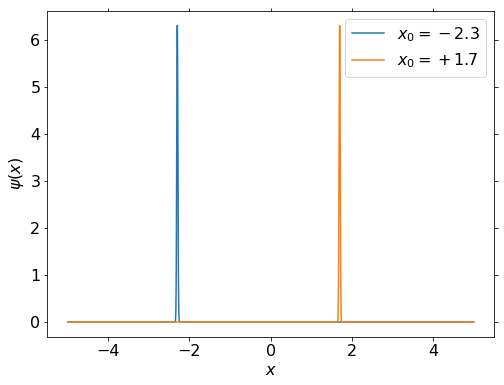

In [15]:
# use a Gaussian approximation to a delta function at x_0
# normalization is appropriate for a wave function, differs from a normal Gaussian function!
def neardelta(x, x_0):
    SIGMA=0.01
    return (1/(2*math.pi*SIGMA**2)**.25)*numpy.exp(-(x-x_0)**2/(4*SIGMA**2))

xvals = numpy.linspace(-5, 5, 5000)
plt.plot(xvals, neardelta(xvals, -2.3), label='$x_0 = -2.3$')
plt.plot(xvals, neardelta(xvals, +1.7), label='$x_0 = +1.7$')
plt.ylabel('$\psi(x)$')
plt.xlabel('$x$')
plt.legend()
plt.show()

### Particles with fixed momentum
Particles with fixed momenta have wave functions that look more like classical waves. The real and imaginary parts behave like sine waves, and the magnitude of the wave function is constant for all $x$.  They take the form

$$ \psi(x) = C \exp(i p x/\hbar) $$

where we have introduced the symbol $\hbar \equiv h/2\pi$ (pronounced "h-bar", and technically called the "reduced Planck's constant"). $C$ is a (complex number) constant normalization factor.  The wavelength of these waves is the de Broglie wavelength, $h/p$.

There is a problem here - since $|\psi(x)|^2$ is constant, integrating it from $x=-\infty$ to $\infty$ gives infinity unless $|\psi(x)|^2$ is zero; so it's not really possible to have a pure momentum state in reality. We tend to just restrict the range of $x$ that we consider.

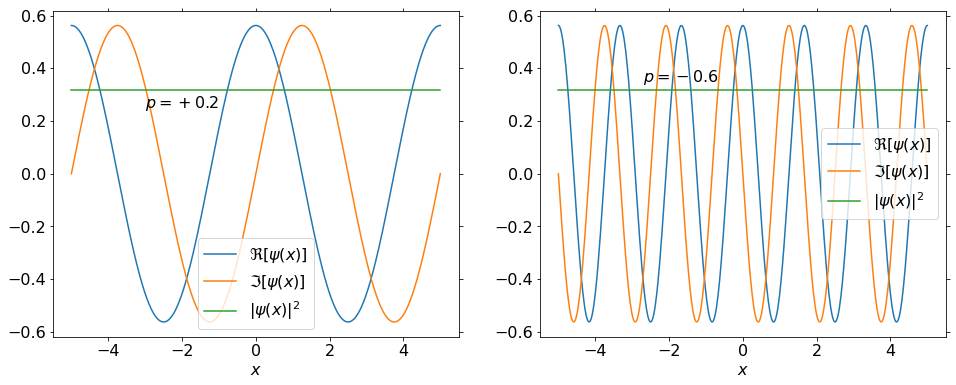

In [64]:
# plane wave
# normalization is OK for the range [-5,5]
# here we implicitly set h = 1
def mom(x, p):
    return (1/10**.25)*numpy.exp((1j*2*math.pi)*p*x)

plt.subplots(1,2, figsize=(16,6))
plt.subplot(1,2,1)
xvals = numpy.linspace(-5, 5, 500)
plt.plot(xvals, mom(xvals, 0.2).real, label='$\Re[\psi(x)]$')
plt.plot(xvals, mom(xvals, 0.2).imag, label='$\Im[\psi(x)]$')
plt.plot(xvals, numpy.abs(mom(xvals, 0.2))**2, label='$|\psi(x)|^2$')
plt.xlabel('$x$')
plt.text(-3, 0.25, '$p=+0.2$')
plt.legend()
plt.subplot(1,2,2)
plt.plot(xvals, mom(xvals, -0.6).real, label='$\Re[\psi(x)]$')
plt.plot(xvals, mom(xvals, -0.6).imag, label='$\Im[\psi(x)]$')
plt.plot(xvals, numpy.abs(mom(xvals, -0.6))**2, label='$|\psi(x)|^2$')
plt.xlabel('$x$')
plt.text(-2.7, 0.35, '$p=-0.6$')
plt.legend()
plt.show()

We can get the momentum from one of these wave functions by taking a Fourier transform:

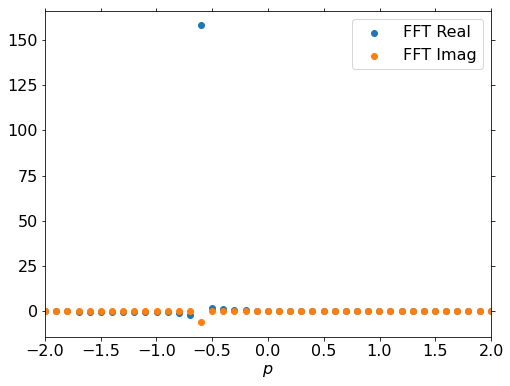

In [55]:
plt.scatter(numpy.fft.fftfreq(xvals.size, d=xvals[1]-xvals[0]), numpy.fft.fft(mom(xvals, -0.6)).real, label='FFT Real')
plt.scatter(numpy.fft.fftfreq(xvals.size, d=xvals[1]-xvals[0]), numpy.fft.fft(mom(xvals, -0.6)).imag, label='FFT Imag')
plt.xlim(-2,2)
plt.xlabel('$p$')
plt.legend()
plt.show()

### Wave packets

These are the most usual wave functions for realistic particle states; the particle is contained within some range, and is moving with some momentum - these are the "wave packets" we showed earlier.

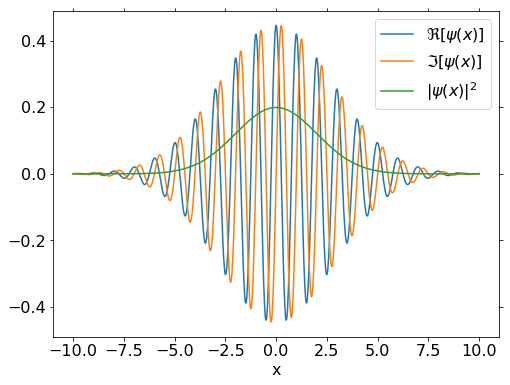

In [74]:
def gaus_wavepacket(x, p, sigma):
    return (1/(2*math.pi*sigma**2)**.25)*numpy.exp(-xval**2/(4*sigma**2))*numpy.exp(p*2*math.pi*1j*xval)

xvals=numpy.linspace(-10,10,1000)
P=+1
SIGMA=2
packet = gaus_wavepacket(xval, P, SIGMA)
plt.plot(xvals, packet.real, label='$\Re[\psi(x)]$')
plt.plot(xvals, packet.imag, label='$\Im[\psi(x)]$')
plt.plot(xvals, numpy.abs(packet)**2, label='$|\psi(x)|^2$')

plt.legend(loc='upper right')
plt.xlabel('x')
plt.show()

What is the momentum of this wave packet? Let's look at the FFT output:

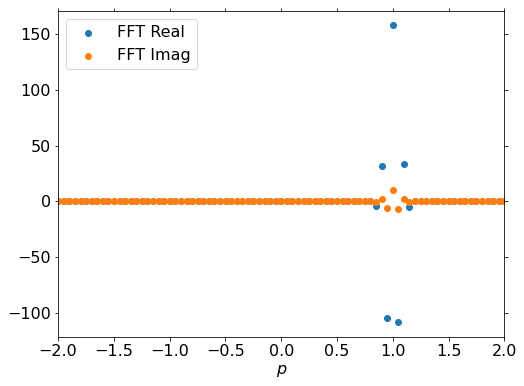

In [75]:
plt.scatter(numpy.fft.fftfreq(xvals.size, d=xvals[1]-xvals[0]), numpy.fft.fft(packet).real, label='FFT Real')
plt.scatter(numpy.fft.fftfreq(xvals.size, d=xvals[1]-xvals[0]), numpy.fft.fft(packet).imag, label='FFT Imag')
plt.xlim(-2,2)
plt.xlabel('$p$')
plt.legend()
plt.show()

We see that there's not just one frequency in this wave: there are several components, clustered at 1.

This series of results is a hint of the upcoming *position-momentum uncertainty principle*: If we describe particles with wave functions, there is a tradeoff between how precise the wave function is in position, and how precise it is in momentum. As we constrain the position more, the momentum becomes more uncertain (even if still contained in a range).